In [ ]:
!pip install PyMuPDF

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 88.2 MB/s eta 0:00:00


# **Functions to extract the nodes(subjects) from the file and compute similarity to create edges-**

In [ ]:
import fitz  # PyMuPDF
import re
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Function to load and extract text from a PDF
def extract_text_from_pdf(pdf_path):
    doc = fitz.open(pdf_path)
    text = ''
    for page in doc:
        text += page.get_text()
    print("Extracted text length:", len(text))
    return text

# Function to extract courses using regex
def extract_courses(text):
    course_pattern = re.compile(r'(MST\d{3}[A-Z]*):?\s+(.*?)\n\n?(.*?)(?=\n\n|MST\d{3}|$)', re.DOTALL)
    courses = course_pattern.findall(text)
    return courses

# Function to structure course details into a dictionary
def extract_subjects(courses):
    subjects = {}
    for code, title, details in courses:
        subjects[code.strip()] = {
            'title': title.strip(),
            'details': details.strip()
        }
    print("Extracted subjects:", list(subjects.items())[:5])
    return subjects

# Function to vectorize course descriptions and compute cosine similarity
def compute_similarity(subjects):
    course_texts = [info['details'] for info in subjects.values()]
    vectorizer = TfidfVectorizer(max_df=0.85, min_df=0.02, stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(course_texts)
    cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)
    return cosine_sim

# Function to create edges based on similarity threshold
def create_edges(course_titles, cosine_sim, threshold):
    return [(course_titles[i], course_titles[j])
            for i in range(len(course_titles))
            for j in range(i + 1, len(course_titles))
            if cosine_sim[i, j] > threshold]

# Function to iteratively adjust threshold and generate edges for graph
def generate_edges(subjects, cosine_sim):
    course_titles = [info['title'] for info in subjects.values()]
    upper_triangle_similarities = cosine_sim[np.triu_indices_from(cosine_sim, k=1)]
    mean_similarity = np.mean(upper_triangle_similarities)
    std_similarity = np.std(upper_triangle_similarities)
    threshold = mean_similarity + std_similarity

    min_edges = len(subjects) - 1
    max_edges = min_edges * 3

    edges = create_edges(course_titles, cosine_sim, threshold)

    # Adjust threshold to get the right number of edges
    while len(edges) < min_edges or len(edges) > max_edges:
        if len(edges) < min_edges:
            threshold -= std_similarity * 0.1
        else:
            threshold += std_similarity * 0.1
        edges = create_edges(course_titles, cosine_sim, threshold)

    return course_titles, edges

# Function to plot the main graph
def plot_main_graph(course_titles, edges):
    G1 = nx.Graph()
    G1.add_nodes_from(course_titles)
    G1.add_edges_from(edges)

    print(f"Number of nodes: {G1.number_of_nodes()}, Number of edges: {G1.number_of_edges()}")

    plt.figure(figsize=(18, 10))
    pos = nx.spring_layout(G1, k=6.0, iterations=40)
    nx.draw(G1, pos, with_labels=True, node_size=700, node_color='skyblue', edge_color='gray', linewidths=1, font_size=8)

    degree_centrality = nx.degree_centrality(G1)
    important_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:5]
    nx.draw_networkx_nodes(G1, pos, nodelist=important_nodes, node_color='red')

    plt.title("Graph of MSc Statistics Courses")
    plt.show()

    return G1

# Function to plot a sub-graph for a specific course
def plot_subgraph(G, specific_title):
    if specific_title in G:
        sub_graph = nx.ego_graph(G, specific_title)
        plt.figure(figsize=(10, 6))
        pos = nx.spring_layout(sub_graph, k=1, iterations=20)
        nx.draw(sub_graph, pos, with_labels=True, node_size=700, node_color='lightgreen', edge_color='gray', linewidths=1, font_size=8)
        plt.title(f"Sub-Graph of '{specific_title}' and its Neighbors")
        plt.show()
    else:
        print(f"Course title '{specific_title}' not found in the graph.")

# Main function to execute the workflow
def nngd(pdf_path):
    # Step 1: Extract text from the PDF
    text = extract_text_from_pdf(pdf_path)

    # Step 2: Extract courses
    courses = extract_courses(text)

    # Step 3: Extract subjects dictionary
    subjects = extract_subjects(courses)

    # Step 4: Compute cosine similarity
    cosine_sim = compute_similarity(subjects)

    # Step 5: Generate edges for the graph
    course_titles, edges = generate_edges(subjects, cosine_sim)
    return courses, subjects, course_titles, edges


def pmg(course_titles, edges):
    # Step 6: Plot the main graph
    G = plot_main_graph(course_titles, edges)
    return G

def psp(G, specific_title=None):
    if specific_title in G:
        plot_subgraph(G, specific_title)





.






.


.





# **1. Creating a Graph Network for MSc.Data Science-**

In [ ]:
pdf_path = '/content/MDS-2024_22-06-2024.pdf'
courses, subjects, course_titles, edges = nngd(pdf_path)

Extracted text length: 143979
Extracted subjects: [('MDS131', {'title': 'Research methods in Data Science', 'details': '60\n5\n4\n100\nESE'}), ('MDS132', {'title': 'PROBABILITY AND DISTRIBUTION THEORY', 'details': 'Total Teaching Hours for Semester: 60\nNo of hours per week: 5\nMax Marks: 100 \nCredits: 4\nCourse Type: Major\nCourse Description\nProbability and probability distributions play an essential role in modeling data from the real- world \nphenomenon. This course will equip students with thorough knowledge in probability and various \nprobability distributions and model real-life data sets with an appropriate probability distribution.\nCourse Outcomes \nUpon completion of the course, students will be able to  \nNo. \nCourse Outcomes \nCO1 \nable to understand the concept of the random variable and expectation for discrete \nand continuous data \nCO2 \nevaluate condition probabilities and conditional expectations  \nCO3 \ngain the knowledge of applications of discrete distribut

In [ ]:
print("The Subjects/Nodes Extracted are: ", course_titles)

The Subjects/Nodes Extracted are:  ['Research methods in Data Science', 'PROBABILITY AND DISTRIBUTION THEORY', 'MATHEMATICAL FOUNDATIONS FOR DATA SCIENCE - I', 'PRINCIPLES OF PROGRAMMING', 'INTRODUCTION TO PROBABILITY AND STATISTICS', 'LINUX ADMINISTRATION', '- PROGRAMMING USING PYTHON', 'APPLIED EXCEL', 'REGRESSION MODELING', 'JAVA PROGRAMMING', '- MACHINE LEARNING', 'CATEGORICAL DATA ANALYSIS', 'MULTIVARIATE ANALYSIS', 'STOCHASTIC PROCESSES', 'SEMINAR', 'CLOUD ESSENTIALS', 'DESIGN AND ANALYSIS OF ALGORITHMS', 'MATHEMATICAL FOUNDATIONS FOR DATA SCIENCE - II', 'DATABASE TECHNOLOGIES', 'INFERENTIAL STATISTICS', 'FULL STACK WEB DEVELOPMENT', 'DATA DRIVEN MODELLING AND VISUALIZATION', 'TIME SERIES AND FORECASTING TECHNIQUES', 'Neural Networks and Deep', 'WEB ANALYTICS', 'IOT ANALYTICS', 'NATURAL LANGUAGE PROCESSING', 'GRAPH ANALYTICS', 'PROJECT-I (WEB PROJECT WITH DATA SCIENCE CONCEPTS)', 'RESEARCH PROBLEM IDENTIFICATION', 'BIG DATA ANALYTICS', 'ECONOMETRICS', 'BAYESIAN INFERENCE', 'BIOST

In [ ]:
print("The Number of Subjects/Nodes Extracted are: ", len(course_titles))

The Number of Subjects/Nodes Extracted are:  43


.

.

.

.

## **Subjects/Nodes extracted matches the number of subject courses of Data Science Syllabus as per the PDF File, similarly the required regex pattern matches with other PG course PDF file as well.**

Number of nodes: 43, Number of edges: 69


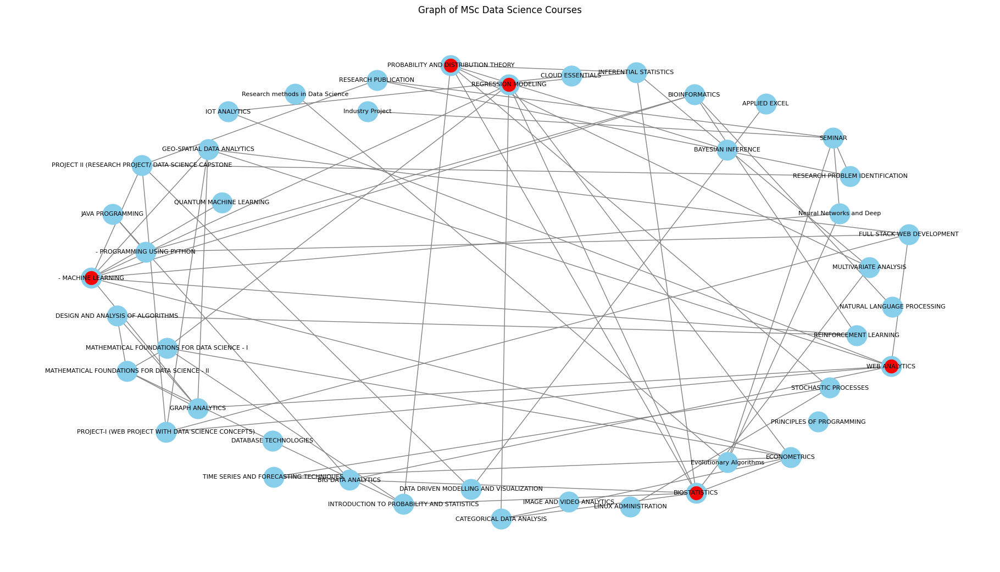

In [ ]:
G1 = pmg(course_titles, edges)

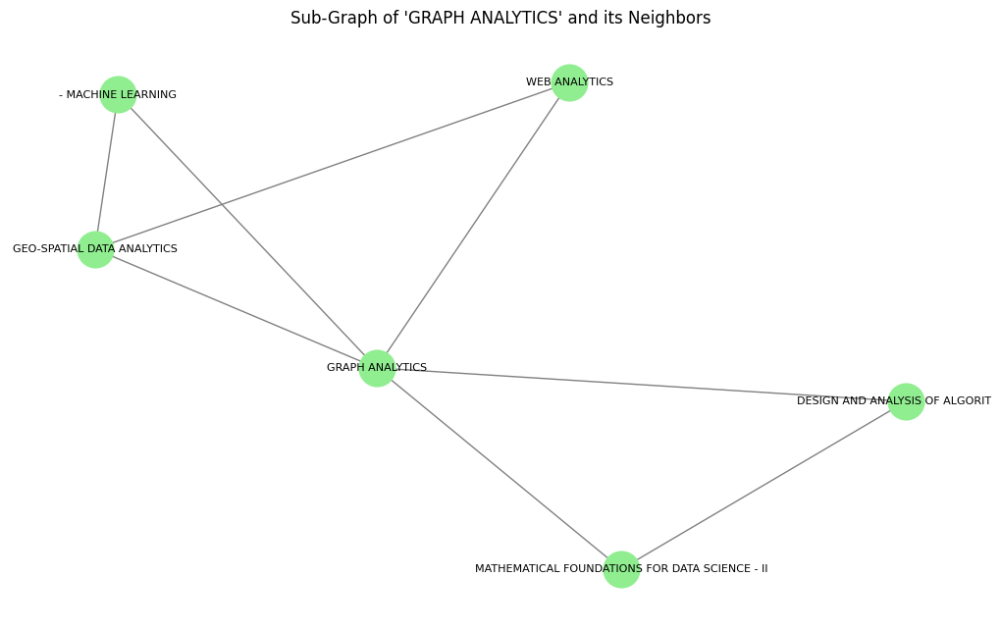

In [ ]:
specific_title = 'GRAPH ANALYTICS'  # Replace with any course title if needed

psp(G1, specific_title)

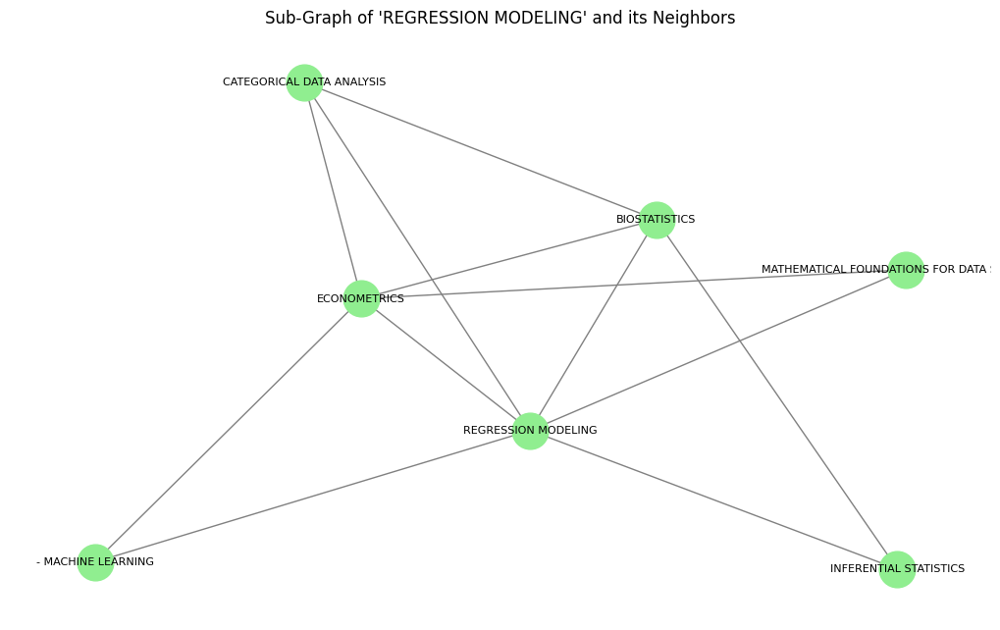

In [ ]:
specific_title = 'REGRESSION MODELING'
psp(G1, specific_title)



.






.


.





# **2. Creating a Graph Network for MSc.Data Analytics-**

In [ ]:
pdf_path = '/content/MSc_Data Analytics_2024_2025_Curriculum &Syllabus.pdf'
courses, subjects, course_titles, edges = nngd(pdf_path)

Extracted text length: 71512
Extracted subjects: [('MDA131', {'title': 'PRINCIPLES OF DATA ANALYTICS', 'details': "Total Teaching Hours for Semester: 60 \nMax Marks: 100 \n \n \n \n \n \n \n \n        Credits: 04 \n \nCourse Objectives \n \nTo provide strong foundation for data analytics and application area related to it and \nunderstand the underlying core concepts and emerging technologies in data analytics. \n \nCourse Outcomes \n \nCO1: Explore the fundamental concepts of data analytics \nCO2: Understand data analysis techniques for applications handling large data \nCO3: Understand various machine learning algorithms used in data analytics process \nCO4: Visualize and present the inference using various tools \nCO5: Learn to think through the ethics surrounding privacy, data sharing and algorithmic \ndecision-making \n \nUnit-1  \n \n \n \n \n \n \n \nTeaching Hours: 12 \n \nINTRODUCTION \nData Analytics - Types – Phases - Quality and Quantity of data – Measurement - Exploratory 


## **Subjects/Nodes extracted-**

In [ ]:
print("The Subjects/Nodes Extracted are: ", course_titles)

The Subjects/Nodes Extracted are:  ['PRINCIPLES OF DATA ANALYTICS', 'STATISTICAL METHODS USING R', 'PYTHON FOR DATA ANALYTICS', 'MATHEMATICAL FOUNDATION FOR DATA ANALYTICS', 'DATABASE TECHNOLOGIES', 'DATA MINING', 'ARTIFICIAL INTELLIGENCE', 'REGRESSION MODELLING', 'BIG DATA ANALYTICS', 'MACHINE LEARNING', 'NATURAL LANGUAGE PROCESSING', 'DATA VISUALIZATION', 'NEURAL NETWORKS AND DEEP LEARNING', 'PROJECT', 'BUSINESS INTELLIGENCE', 'INTERNET OF THINGS', 'WEB ANALYTICS', 'CLOUD ANALYTICS']


In [ ]:
print("The Number of Subjects/Nodes Extracted are: ", len(course_titles))

The Number of Subjects/Nodes Extracted are:  18


Number of nodes: 18, Number of edges: 22


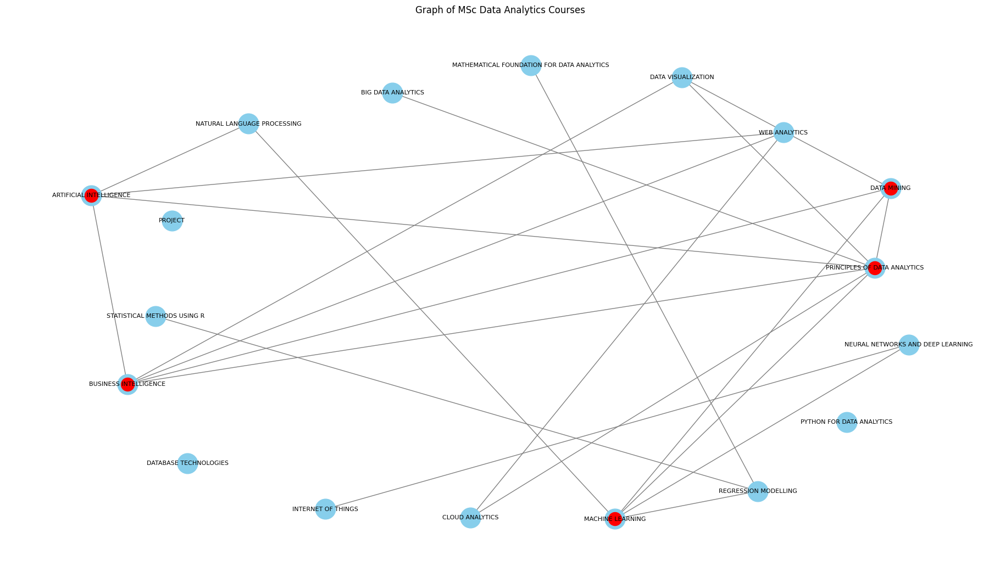

In [ ]:
G2 = pmg(course_titles, edges)

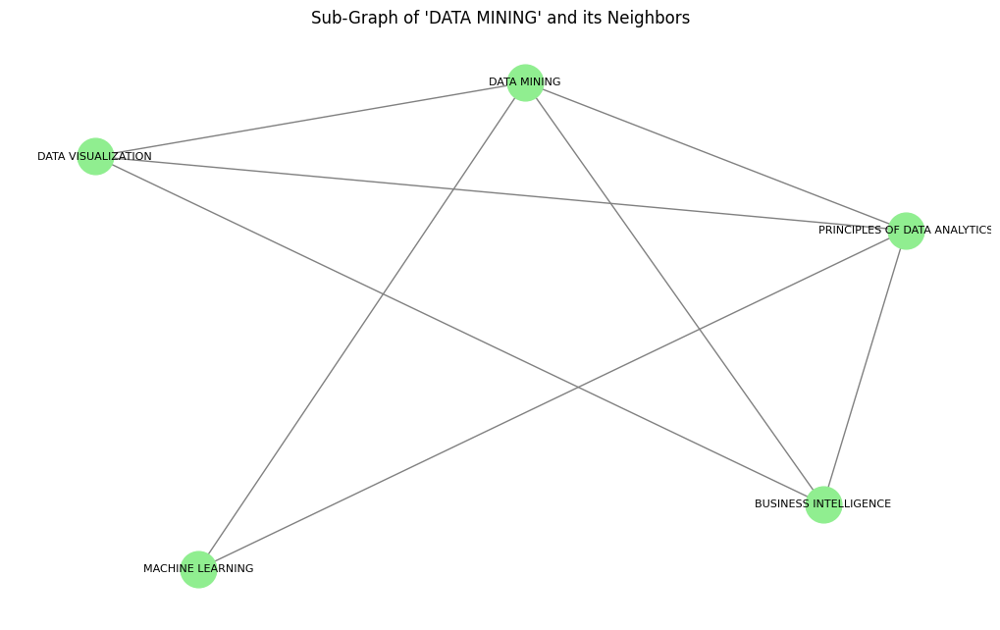

In [ ]:
specific_title = 'DATA MINING'  # Replace with any course title

psp(G2, specific_title)



.






.


.





# **3. Creating a Graph Network for MSc.Statistics-**

In [ ]:
pdf_path = '/content/MSc Stat-2022 TRI.pdf'
courses, subjects, course_titles, edges = nngd(pdf_path)

Extracted text length: 58414
Extracted subjects: [('MST131', {'title': 'Probability Theory', 'details': 'Theory\n60\n05\n04\n100'}), ('MST132', {'title': 'Distribution Theory', 'details': 'Theory\n60\n05\n04\n100'}), ('MST133', {'title': 'Matrix Theory and', 'details': 'Linear Models\nTheory\n60\n05\n04\n100'}), ('MST171', {'title': 'Sample Survey', 'details': 'Designs\nTheory +\nPractical\n75\n06\n04\n100'}), ('MST172', {'title': 'Statistical', 'details': 'Computing using\nPython\nTheory +\nPractical\n75\n06\n04\n100\nHOLOD\nD\nHolistic Education\n12\n01\n01\nTotal 28 21 500\n●Students must complete a MOOC course (minimum eight weeks) in EXCEL before\ncompleting the 1st year of the M.Sc. programme.\nTrimester II\nCode\nCourse\nTheory/Lab\nHrs/Tri\nm\nHours/\nwee k\nCredits\nMarks'})]



## **Subjects/Nodes extracted-**

In [ ]:
print("The Subjects/Nodes Extracted are: ", course_titles)

The Subjects/Nodes Extracted are:  ['Probability Theory', 'Distribution Theory', 'Matrix Theory and', 'Sample Survey', 'Statistical', 'Research', 'Statistical Inference I', 'Regression Analysis', 'Statistical Computing', 'Principles', 'Biostatistics', 'Optimization techniques', 'Statistical Inference II', 'Time Series Analysis', 'Java Programming', 'C', 'Research', 'Survival Analysis', 'Design and Analysis', 'Stochastic Processes', 'C', 'Research Modeling', 'Seminar', '- Statistical Quality Control', 'Multivariate Analysis', 'C', 'C', 'Research Implementation', 'Neural Networks and Deep Learning', '- Statistical Genetics', '- Big Data analytics', '– Demography and Vital Statistics', '- Risk Modelling', 'Bayesian Statistics', '- Spatial Statistics', '- Non-Parametric Methods']


In [ ]:
print("The Number of Subjects/Nodes Extracted are: ", len(course_titles))

The Number of Subjects/Nodes Extracted are:  36


Number of nodes: 32, Number of edges: 65


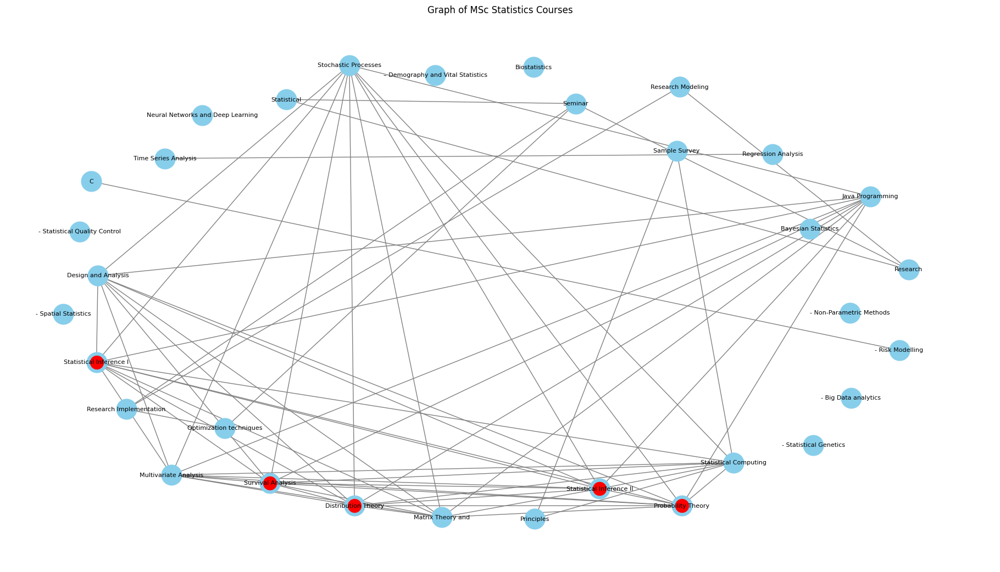

In [ ]:
G3 = pmg(course_titles, edges)

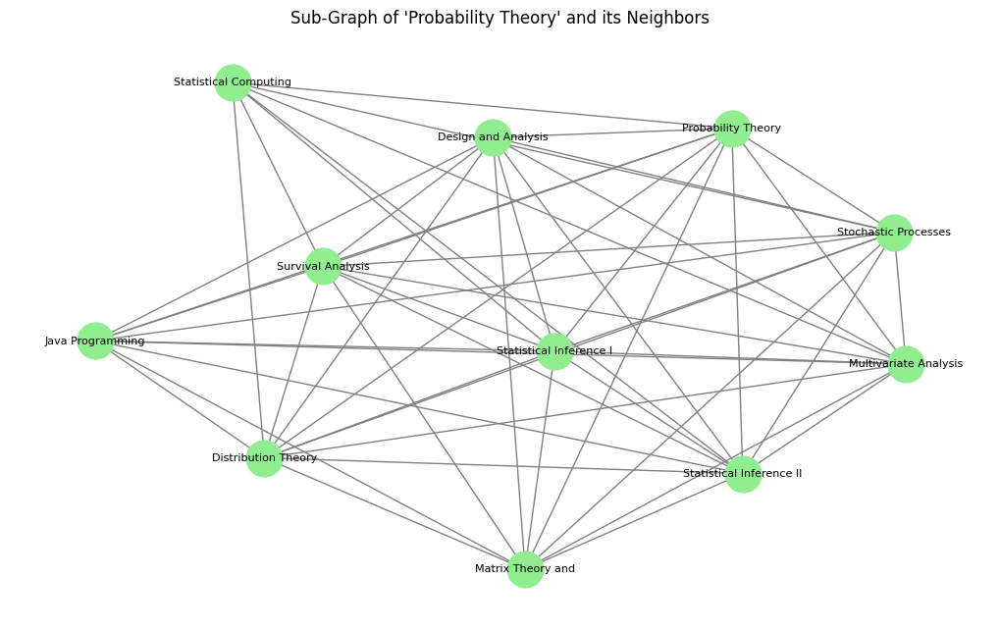

In [ ]:
specific_title = 'Probability Theory'  # Replace with any course title

psp(G3, specific_title)

.


.




.







.

# **Functions to Create, plot a combined graph and perform community detection**

In [ ]:
def create_combined_graph(graph_list):
    """
    Combines multiple graphs into a single graph using nx.compose_all.
    Optionally adds edges between common nodes.

    Parameters:
    graph_list (list): A list of NetworkX graphs to be combined.

    Returns:
    combined_graph: The combined NetworkX graph.
    """
    # Step 1: Compose the graphs
    combined_graph = nx.compose_all(graph_list)

    # Optionally: Add additional edges between common nodes
    common_nodes = set(graph_list[0].nodes())
    for G in graph_list[1:]:
        common_nodes.intersection_update(G.nodes())

    for node in common_nodes:
        if not combined_graph.has_edge(node, node):
            combined_graph.add_edge(node, node)  # Add self-loop (customize as needed)

    # Debugging: Output the number of nodes and edges
    print(f"Combined graph has {combined_graph.number_of_nodes()} nodes and {combined_graph.number_of_edges()} edges.")

    return combined_graph





def plot_combined_graph(combined_graph, title="Combined Graph", k=3.2, iterations=50):
    """
    Plots the combined graph using spring layout.

    Parameters:
    combined_graph (Graph): The NetworkX graph to be plotted.
    title (str): Title for the plot.
    k (float): Spring layout constant (default: 3.2).
    iterations (int): Number of iterations for layout computation (default: 50).
    """
    # Generate layout
    pos = nx.spring_layout(combined_graph, k=k, iterations=iterations)

    # Set figure size
    plt.figure(figsize=(28, 15))

    # Draw nodes and edges
    nx.draw_networkx_nodes(combined_graph, pos, node_size=700, node_color='skyblue')
    nx.draw_networkx_edges(combined_graph, pos, width=1.5, alpha=0.7, edge_color='gray')

    # Draw node labels
    nx.draw_networkx_labels(combined_graph, pos, font_size=10, font_color='black', font_family="sans-serif")

    degree_centrality = nx.degree_centrality(combined_graph)
    important_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:5]
    nx.draw_networkx_nodes(combined_graph, pos, nodelist=important_nodes, node_color='red')

    # Turn off the axis
    plt.axis('off')

    # Set title and display the plot
    plt.title(title)
    plt.show()


import community.community_louvain as community_louvain
import matplotlib.cm as cm

def detect_and_plot_communities(combined_graph, title="Community Detection"):
    """
    Detects communities in a combined graph using the Louvain method and plots the result.

    Parameters:
    combined_graph (Graph): The NetworkX graph in which communities are detected.
    title (str): Title for the plot (default: "Community Detection").
    """
    # Step 1: Perform community detection
    partition = community_louvain.best_partition(combined_graph)

    # Debugging: Output the number of communities detected
    print(f"Detected {len(set(partition.values()))} communities.")

    # Step 2: Visualize the graph with communities
    pos = nx.spring_layout(combined_graph, k=3.2, iterations=50)

    # Set figure size
    plt.figure(figsize=(25, 15))

    # Color map for communities
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)

    # Draw nodes with community colors
    nx.draw_networkx_nodes(combined_graph, pos, node_size=700, cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(combined_graph, pos, width=1.5, alpha=0.7, edge_color='gray')

    # Draw node labels
    nx.draw_networkx_labels(combined_graph, pos, font_size=10, font_color='black', font_family="sans-serif")

    # Turn off axis
    plt.axis('off')

    # Set title and display the plot
    plt.title(title)
    plt.show()



.


.




.







.

# **1. Combined Graph of Data Science and Data Analytics**

Combined graph has 57 nodes and 95 edges.


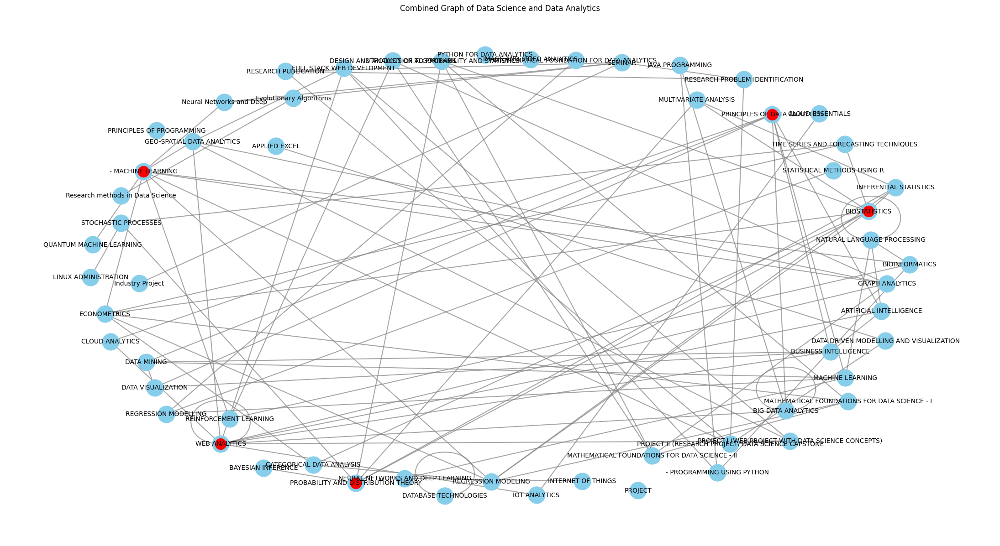

In [ ]:
# Create combined graph
combined_graph = create_combined_graph([G1, G2])

# Plot combined graph
plot_combined_graph(combined_graph, title="Combined Graph of Data Science and Data Analytics")

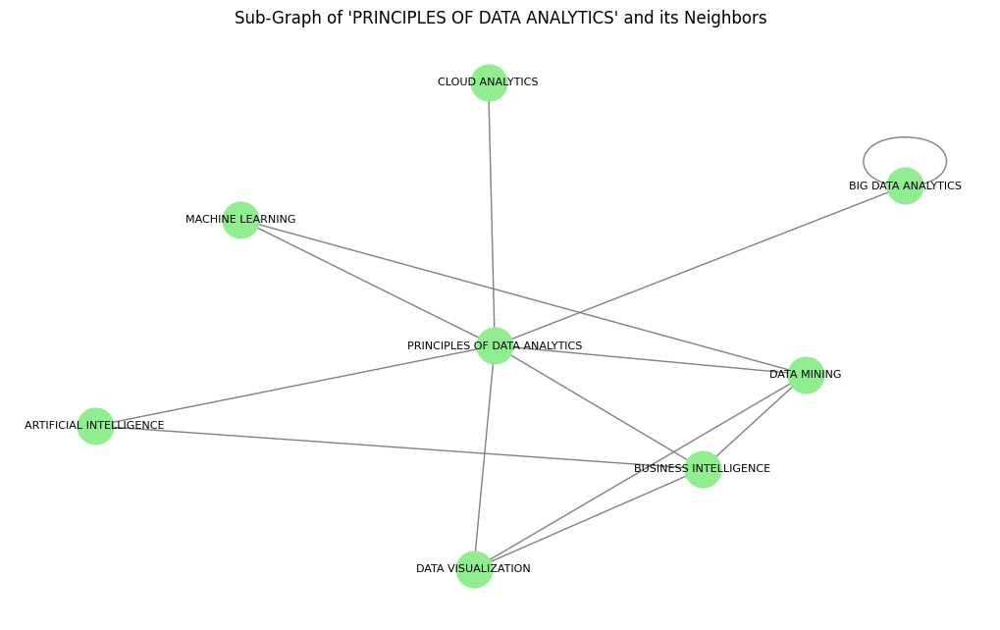

In [ ]:
specific_title = 'PRINCIPLES OF DATA ANALYTICS'  # Replace with any course title

psp(combined_graph, specific_title)

.


.



# **Community Detection in Combined Graph of Data Science and Data Analytics**

Detected 10 communities.


<ipython-input-131-56740a69524a>:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


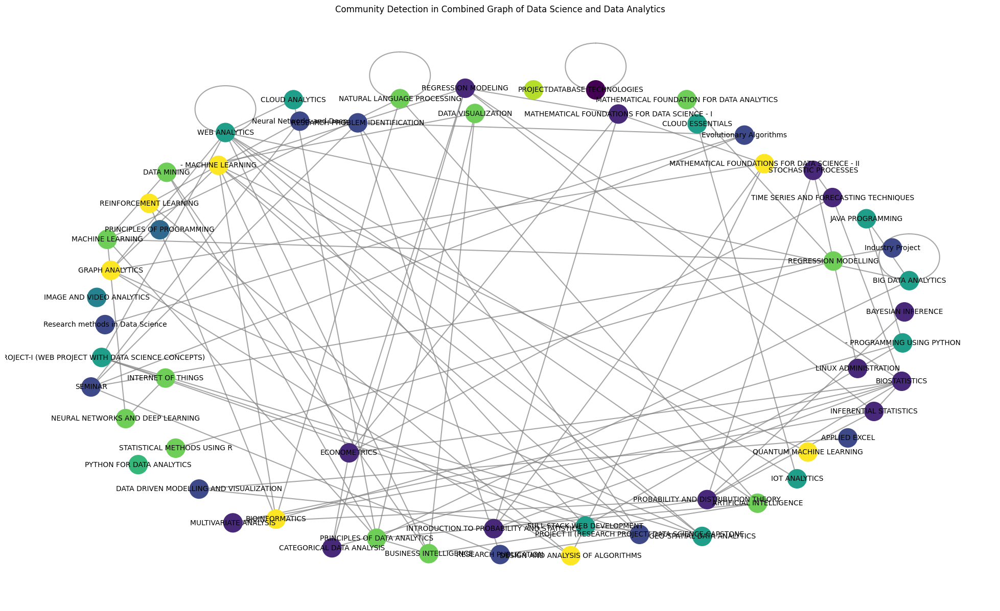

In [ ]:
# Perform community detection and plot
detect_and_plot_communities(combined_graph, title="Community Detection in Combined Graph of Data Science and Data Analytics")

.


.



# **Combined Graph of Data Science and Data Analytics**

Combined graph has 50 nodes and 87 edges.


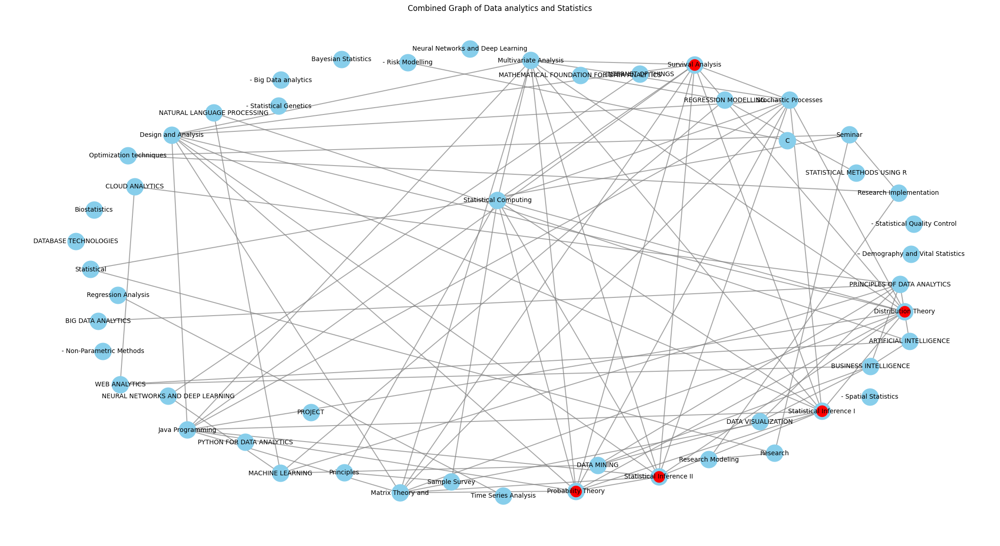

In [ ]:
# Create combined graph
combined_graph = create_combined_graph([G2, G3])

# Plot combined graph
plot_combined_graph(combined_graph, title="Combined Graph of Data analytics and Statistics")

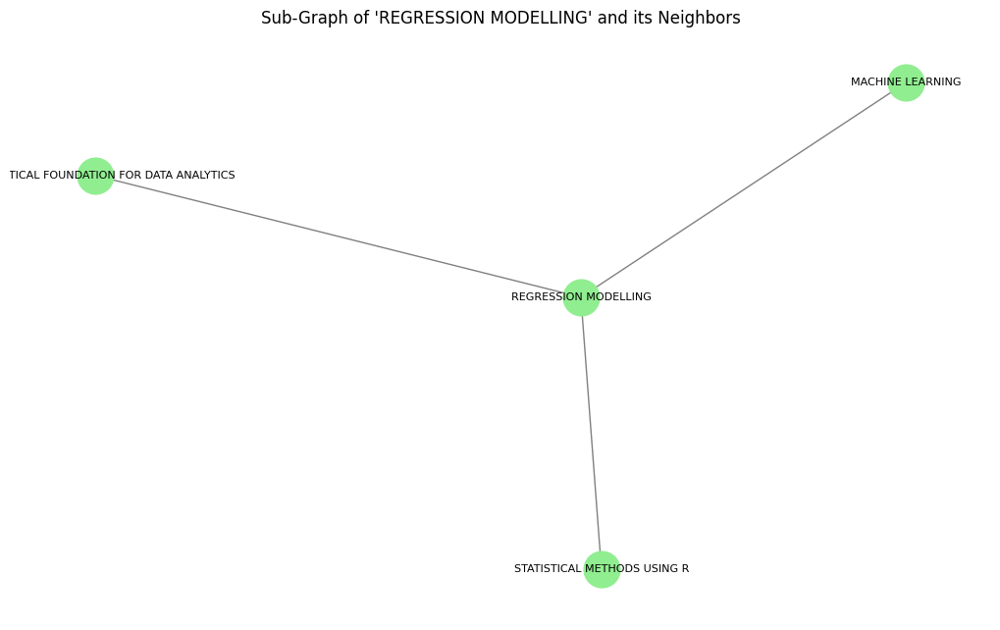

In [ ]:
specific_title = 'REGRESSION MODELLING'  # Replace with any course title

psp(combined_graph, specific_title)

.


.



# **Community Detection in Combined Graph of Statistics and Data Analytics**

Detected 19 communities.


<ipython-input-131-56740a69524a>:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


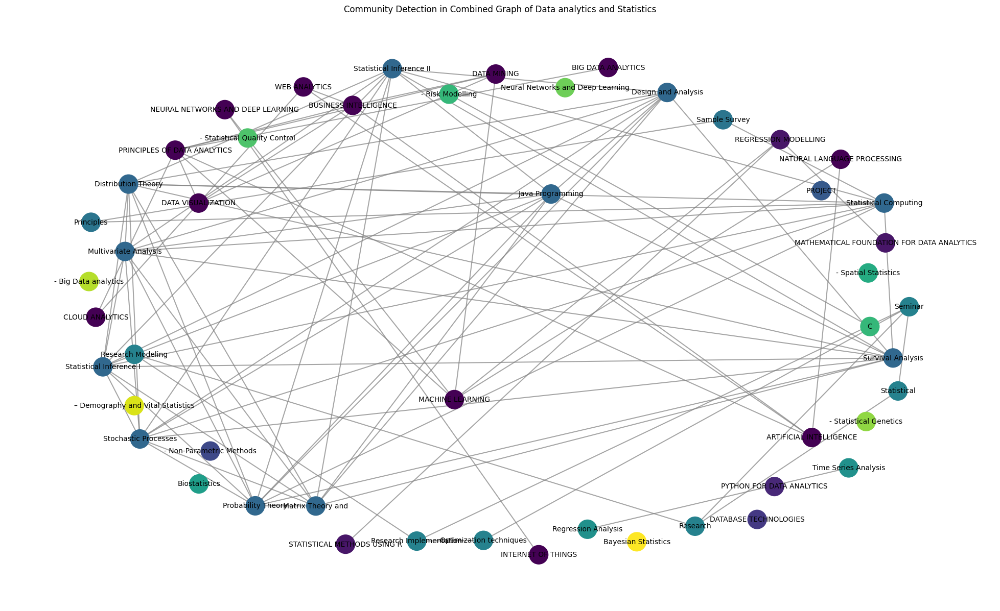

In [ ]:
# Perform community detection and plot
detect_and_plot_communities(combined_graph, title="Community Detection in Combined Graph of Data analytics and Statistics")

.


.



# **Community Detection in Combined Graph of Statistics and Data Science**

Combined graph has 75 nodes and 134 edges.


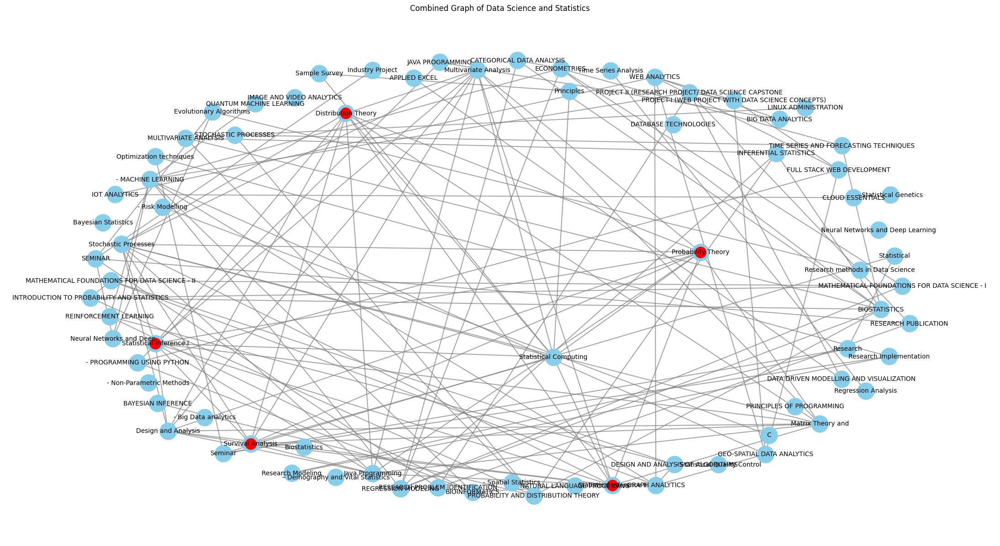

In [ ]:
# Create combined graph
combined_graph = create_combined_graph([G1, G3])

# Plot combined graph
plot_combined_graph(combined_graph, title="Combined Graph of Data Science and Statistics")

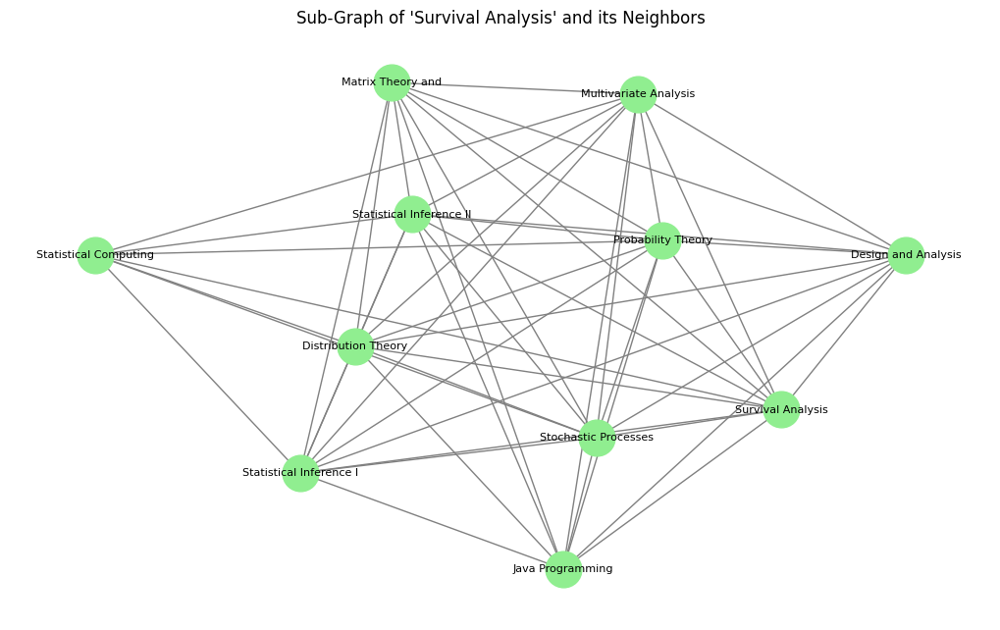

In [ ]:
specific_title = 'Survival Analysis'  # Replace with any course title

psp(combined_graph, specific_title)

Detected 19 communities.


<ipython-input-92-56740a69524a>:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


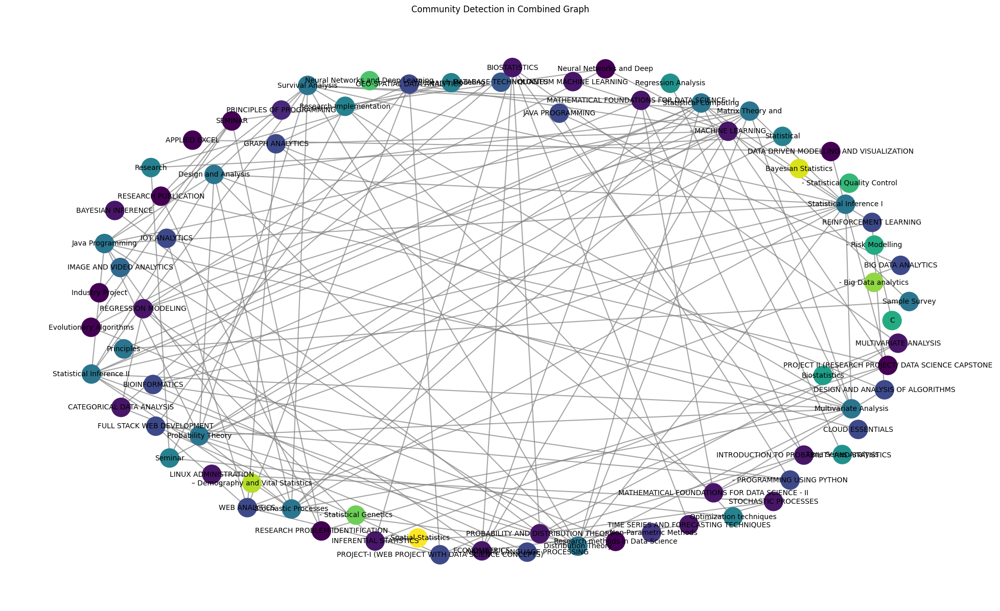

In [ ]:
# Perform community detection and plot
detect_and_plot_communities(combined_graph, title="Community Detection in Combined Graph")

.


.



# **Community Detection in Combined Graph of 3 PG Courses**

Combined graph has 89 nodes and 156 edges.


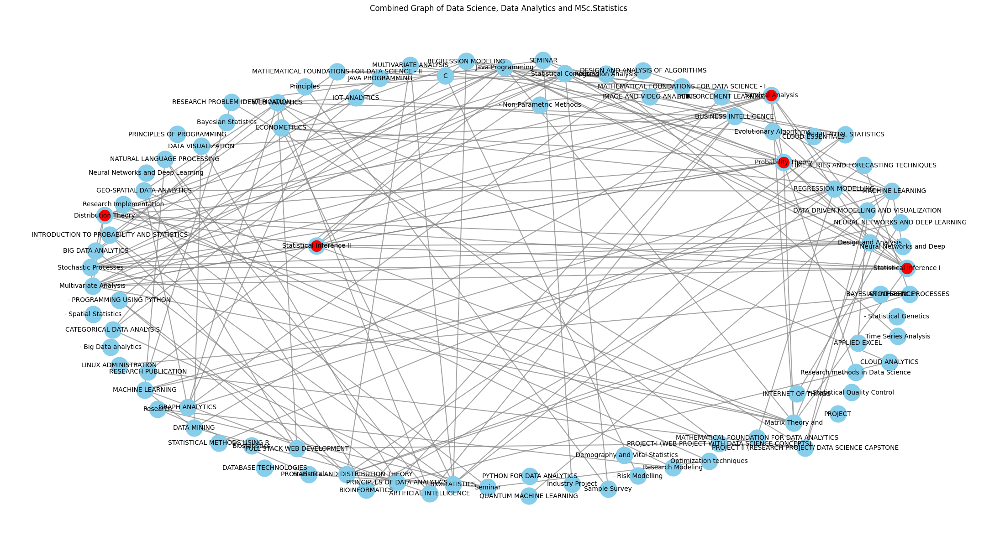

In [ ]:
# Create combined graph
combined_graph = create_combined_graph([G1, G2, G3])

# Plot combined graph
plot_combined_graph(combined_graph, title="Combined Graph of Data Science, Data Analytics and MSc.Statistics ")

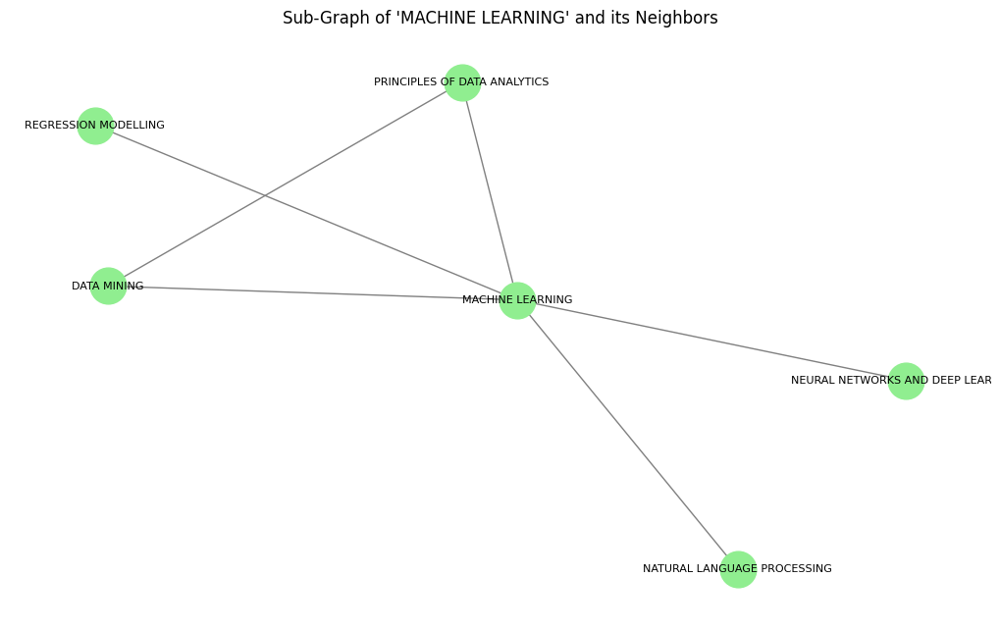

In [ ]:
specific_title = 'MACHINE LEARNING'  # Replace with any course title

psp(combined_graph, specific_title)

Detected 22 communities.


<ipython-input-92-56740a69524a>:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


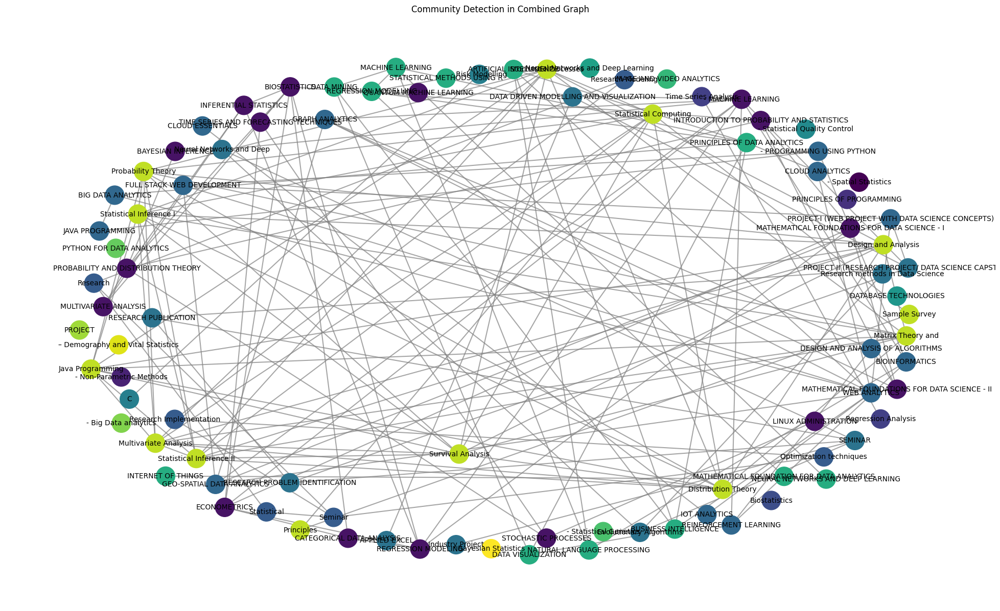

In [ ]:
# Perform community detection and plot
detect_and_plot_communities(combined_graph, title="Community Detection in Combined Graph")